<a href="https://www.kaggle.com/code/wangapa106g/lumbar-desease-diag?scriptVersionId=220585580" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
import os
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
train = pd.read_csv('/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train.csv')
train.head(2)

import warnings

# Disable all warnings
warnings.filterwarnings('ignore')

In [2]:
sample_submission=pd.read_csv('/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/sample_submission.csv')
sample_submission.head(2)

,row_id,normal_mild,moderate,severe
0,44036939_left_neural_foraminal_narrowing_l1_l2,0.333333,0.333333,0.333333
1,44036939_left_neural_foraminal_narrowing_l2_l3,0.333333,0.333333,0.333333


In [3]:
train_label_coordinates=pd.read_csv('/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_label_coordinates.csv')
train_label_coordinates.head()

,study_id,series_id,instance_number,condition,level,x,y
0,4003253,702807833,8,Spinal Canal Stenosis,L1/L2,322.831858,227.964602
1,4003253,702807833,8,Spinal Canal Stenosis,L2/L3,320.571429,295.714286
2,4003253,702807833,8,Spinal Canal Stenosis,L3/L4,323.030303,371.818182
3,4003253,702807833,8,Spinal Canal Stenosis,L4/L5,335.292035,427.327434
4,4003253,702807833,8,Spinal Canal Stenosis,L5/S1,353.415929,483.964602


In [4]:
train_series_descriptions=pd.read_csv('/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_series_descriptions.csv')
train_series_descriptions.head(2)

,study_id,series_id,series_description
0,4003253,702807833,Sagittal T2/STIR
1,4003253,1054713880,Sagittal T1


In [5]:
train_label_coordinates['label']=train_label_coordinates['condition'].str.lower().str.replace(' ','_')+'_'+train_label_coordinates['level'].str.lower().str.replace("/", "_").str.replace(" ", "_")
train_label_coordinates.head(2)

,study_id,series_id,instance_number,condition,level,x,y,label
0,4003253,702807833,8,Spinal Canal Stenosis,L1/L2,322.831858,227.964602,spinal_canal_stenosis_l1_l2
1,4003253,702807833,8,Spinal Canal Stenosis,L2/L3,320.571429,295.714286,spinal_canal_stenosis_l2_l3


In [6]:
final_df = pd.merge(train_label_coordinates, train, on='study_id', how='left')

def get_case(row):
    # Check if the label in the final_df matches any of the columns in df
    if row['label'] in train.columns:
        return row[row['label']]
    else:
        return None

# Apply the get_case function to create the "case" column
final_df['case'] = final_df.apply(get_case, axis=1)

final_df = final_df[['study_id', 'series_id', 'instance_number', 'label', 'x', 'y', 'case']]
final_df = pd.merge(final_df, train_series_descriptions[['series_id', 'series_description']],
                    on='series_id', how='left')

In [7]:
final_df.head(2)

,study_id,series_id,instance_number,label,x,y,case,series_description
0,4003253,702807833,8,spinal_canal_stenosis_l1_l2,322.831858,227.964602,Normal/Mild,Sagittal T2/STIR
1,4003253,702807833,8,spinal_canal_stenosis_l2_l3,320.571429,295.714286,Normal/Mild,Sagittal T2/STIR


In [8]:
final_df['case'].unique()

array(['Normal/Mild', 'Moderate', 'Severe', nan], dtype=object)

In [9]:
diagnoses=final_df['label'].unique()[:].tolist()
diagnoses

['spinal_canal_stenosis_l1_l2',
 'spinal_canal_stenosis_l2_l3',
 'spinal_canal_stenosis_l3_l4',
 'spinal_canal_stenosis_l4_l5',
 'spinal_canal_stenosis_l5_s1',
 'right_neural_foraminal_narrowing_l4_l5',
 'right_neural_foraminal_narrowing_l5_s1',
 'right_neural_foraminal_narrowing_l3_l4',
 'right_neural_foraminal_narrowing_l1_l2',
 'right_neural_foraminal_narrowing_l2_l3',
 'left_neural_foraminal_narrowing_l1_l2',
 'left_neural_foraminal_narrowing_l4_l5',
 'left_neural_foraminal_narrowing_l5_s1',
 'left_neural_foraminal_narrowing_l2_l3',
 'left_neural_foraminal_narrowing_l3_l4',
 'left_subarticular_stenosis_l1_l2',
 'right_subarticular_stenosis_l1_l2',
 'left_subarticular_stenosis_l2_l3',
 'right_subarticular_stenosis_l2_l3',
 'left_subarticular_stenosis_l3_l4',
 'right_subarticular_stenosis_l3_l4',
 'left_subarticular_stenosis_l4_l5',
 'right_subarticular_stenosis_l4_l5',
 'left_subarticular_stenosis_l5_s1',
 'right_subarticular_stenosis_l5_s1']

In [10]:
df_list=[]
for diagnosis in diagnoses:
  df=final_df[final_df['label']==diagnosis]
  df_list.append(df)

In [11]:
len(df_list)

25

In [12]:
import tensorflow as tf
import tensorflow_io as tfio
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix

In [13]:
main_directory = '/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images'
image_paths = []
diag_list=[]
list_labels=[]
list_of_label=[]
for i in range(len(df_list)):
  for index, row in df_list[i].iterrows():
    study_id = row['study_id']
    image_path = os.path.join(main_directory,  str(study_id), str(row['series_id']), f"{row['instance_number']}.dcm")
    label = row['case']
    list_of_label.append(label)
    image_paths.append(image_path)
  diag_list.append(image_paths)
  list_labels.append(list_of_label)

image shape: (640, 640)
image shape: (540, 384)
image shape: (320, 320)
image shape: (320, 320)
image shape: (512, 512)
image shape: (448, 448)
image shape: (640, 640)
image shape: (320, 320)
image shape: (490, 448)
image shape: (384, 384)
image shape: (384, 384)
image shape: (320, 320)
image shape: (320, 320)
image shape: (448, 448)
image shape: (512, 512)
image shape: (996, 768)
image shape: (512, 512)
image shape: (448, 448)
image shape: (384, 384)
image shape: (768, 768)
image shape: (224, 224)
image shape: (920, 768)
image shape: (320, 320)
image shape: (456, 384)
image shape: (512, 512)


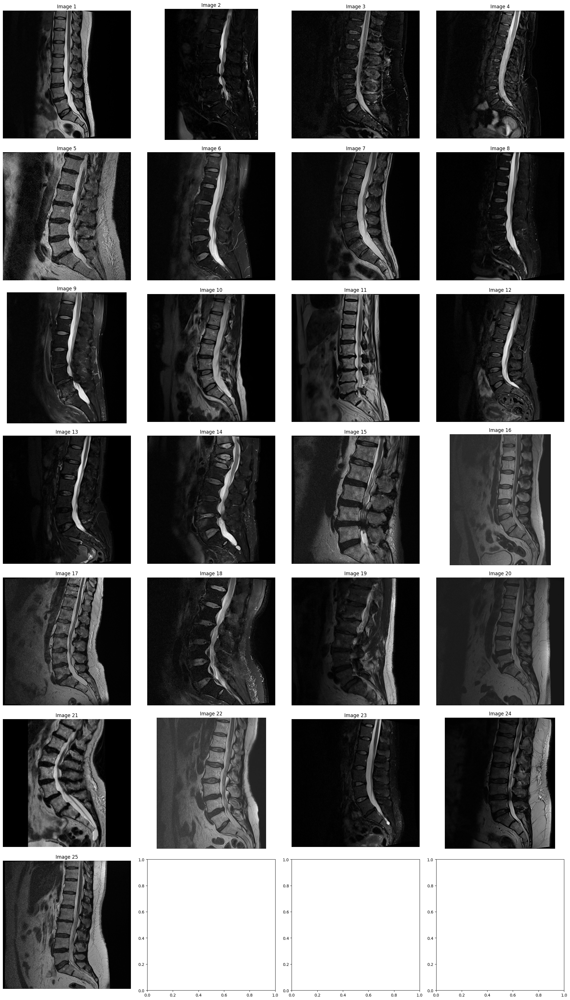

In [14]:
import pydicom
n_images = len(diag_list)
n_cols = 4  # Set the number of columns to 4
n_rows = (n_images + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 5 * n_rows))  # Adjust figsize for better spacing
axes = axes.flatten()
for i in range(len(diag_list[0][:25])):
  dcm=pydicom.dcmread(diag_list[0][i])
  image = dcm.pixel_array
  print('image shape:',image.shape)
  axes[i].imshow(image, cmap='gray')
  axes[i].set_title(f"Image {i+1}")
  axes[i].axis('off')
plt.tight_layout()
plt.show()

In [15]:
import pydicom
import tempfile

def process_dicom(file_name_tensor):
    try:
        # Convert TensorFlow tensor to a string
        file_name = file_name_tensor.numpy().decode("utf-8")

        # Read the DICOM file
        dicom = pydicom.dcmread(file_name, force=True)

        # Validate DICOM file (check pixel data availability)
        if not hasattr(dicom, "PixelData"):
            raise ValueError(f"File {file_name} is missing pixel data. Skipping.")

        # Check and handle missing Group Length (optional)
        if (0x0002, 0x0000) not in dicom.file_meta:
            dicom.file_meta[(0x0002, 0x0000)] = pydicom.DataElement((0x0002, 0x0000), "UL", 0)

        # Save the modified DICOM to a temporary file
        temp_file = tempfile.NamedTemporaryFile(delete=False, suffix=".dcm")
        dicom.save_as(temp_file.name)

        # Return the file path
        return temp_file.name.encode("utf-8")  # Return as bytes for TensorFlow compatibility

    except Exception as e:
        # Log the error and raise an exception for further handling
        raise ValueError(f"Error processing DICOM file: {e}")

In [16]:


def load_image(file_name, label):
    file_name = tf.py_function(func=process_dicom, inp=[file_name], Tout=tf.string)

    # Skip corrupt files
    if tf.strings.length(file_name) == 0:
        return tf.zeros([128, 128, 1], dtype=tf.float32), tf.zeros([3], dtype=tf.float32)

    raw = tf.io.read_file(file_name)
    dicom_array = tfio.image.decode_dicom_image(raw, dtype=tf.uint16)
    tensor = tf.cast(dicom_array, tf.float32)
    
    # Check if the tensor has the correct number of dimensions (3D: height, width, channels)
    tensor_shape = tf.shape(tensor)
    if len(tensor_shape) != 3:  # It should be 3D (height, width, channels)
        print(f"❌ Skipping file due to incorrect shape: {tensor_shape}")
        return tf.zeros([128, 128, 1], dtype=tf.float32), tf.zeros([3], dtype=tf.float32)

    tensor = tf.image.resize(tensor, [128, 128])  # Resize only if valid shape
    tensor = tf.reshape(tensor, [128, 128, 1])  # Ensure it's 3D (height, width, channels)
    tensor = tf.cast(tensor, tf.float32) / 255.0  # Normalize

    target = tf.keras.utils.to_categorical(label, num_classes=3)
    label = tf.convert_to_tensor(target, dtype=tf.float32)

    return tensor, label


In [17]:
from sklearn.preprocessing import LabelEncoder

In [18]:
import pandas as pd
import re
df_ylabel=pd.DataFrame(list_labels[0],columns=['case'])
pattern = r'[^\w\s]'
df_ylabel = df_ylabel.replace(pattern,'', regex=True)
df_ylabel.head(2)

,case
0,NormalMild
1,NormalMild


In [19]:
label_encoder = LabelEncoder()
df_xtrain = pd.DataFrame(diag_list[0], columns=['images'])

df_train=pd.concat([df_xtrain,df_ylabel],axis=1)
df_train=df_train.dropna()
df_train['case']=label_encoder.fit_transform(df_train['case'])
df_train.head(2)

,images,case
0,/kaggle/input/rsna-2024-lumbar-spine-degenerat...,1
1,/kaggle/input/rsna-2024-lumbar-spine-degenerat...,1


In [20]:
df_train['case'].unique()

array([1, 0, 2])

In [21]:
df_train.shape

(48657, 2)

In [22]:
file_names = tf.cast(df_train['images'],dtype=tf.string)
labels = tf.cast(df_train['case'],dtype=tf.int64)
dataset = tf.data.Dataset.from_tensor_slices((file_names, labels))

In [23]:
for elements in dataset.take(6):
  print(elements[0].numpy(),elements[1].numpy())

b'/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/4003253/702807833/8.dcm' 1
b'/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/4646740/3666319702/10.dcm' 1
b'/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/7143189/132939515/9.dcm' 1
b'/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/8785691/481125819/8.dcm' 1
b'/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/10728036/3491739931/11.dcm' 1
b'/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/11340341/3543553307/10.dcm' 1


In [24]:
dataset=dataset.map(lambda x,y:load_image(x,y))

❌ Skipping file due to incorrect shape: Tensor("cond/Shape:0", shape=(4,), dtype=int32)


In [25]:
for elements in dataset.take(6):
  print("image shape:",elements[0].shape,"labels shape:",elements[1].shape)

image shape: (128, 128, 1) labels shape: (3,)
image shape: (128, 128, 1) labels shape: (3,)
image shape: (128, 128, 1) labels shape: (3,)
image shape: (128, 128, 1) labels shape: (3,)
image shape: (128, 128, 1) labels shape: (3,)
image shape: (128, 128, 1) labels shape: (3,)


In [26]:
BUFFER_SIZE = 1000
BATCH_SIZE = 16
NUM_EPOCHS = 20

In [27]:
train_size = int(0.8 * 48656)  # Adjust the split ratio
val_size = 38924 - train_size

x_train = dataset.take(train_size).batch(BATCH_SIZE)
x_val = dataset.skip(train_size).batch(BATCH_SIZE)

In [28]:
for elements in x_train.take(6):
  print("image shape:",elements[0].shape,"labels shape:",elements[1].shape)

image shape: (16, 128, 128, 1) labels shape: (16, 3)
image shape: (16, 128, 128, 1) labels shape: (16, 3)
image shape: (16, 128, 128, 1) labels shape: (16, 3)
image shape: (16, 128, 128, 1) labels shape: (16, 3)
image shape: (16, 128, 128, 1) labels shape: (16, 3)
image shape: (16, 128, 128, 1) labels shape: (16, 3)


In [29]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense, BatchNormalization

model = Sequential([
    Conv2D(32, (3, 3), padding='same', data_format='channels_last',
           activation='relu', name='conv_1', input_shape=(128, 128, 1)),  # Adjusted input shape
    MaxPooling2D((2, 2), padding='same'),
    Dropout(0.5),

    Conv2D(64, (3, 3), padding='same', data_format='channels_last',
           activation='relu', name='conv_2'),
    MaxPooling2D((2, 2), padding='same'),
    Dropout(0.5),

    Conv2D(128, (3, 3), padding='same', data_format='channels_last',
           activation='relu', name='conv_3'),
    MaxPooling2D((2, 2), padding='same'),
    Dropout(0.5),

    Flatten(),
    Dense(1024, activation='relu', name='dense_1'),
    Dense(3, activation='sigmoid', name='output')  # Adjusted output activation to sigmoid
])


In [30]:
model.build(input_shape=(None , 128, 128, 1))
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv_1 (Conv2D)                 │ (None, 128, 128, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_2 (Conv2D)                 │ (None, 64, 64, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_3 (Conv2D)                 │ (None, 32, 32, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1024)           │    33,555,456 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output (Dense)                  │ (None, 3)              │         3,075 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 33,651,203 (128.37 MB)

 Trainable params: 33,651,203 (128.37 MB)

 Non-trainable params: 0 (0.00 B)

In [31]:


model.compile(optimizer=Adam(),
              loss=tf.keras.losses.CategoricalCrossentropy(),
              metrics=['accuracy'])

In [32]:
history = model.fit(
    x_train,  # Training data
    epochs=1,  # Number of epochs to train the model
    validation_data=x_val,
    verbose=1 
)

I0000 00:00:1738585063.965277      69 service.cc:145] XLA service 0x7a68b4006640 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1738585063.965332      69 service.cc:153]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1738585063.965336      69 service.cc:153]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5


   4/2433 ━━━━━━━━━━━━━━━━━━━━ 1:48 45ms/step - accuracy: 1.0000 - loss: 0.0000e+00

I0000 00:00:1738585073.004863      69 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


2433/2433 ━━━━━━━━━━━━━━━━━━━━ 619s 250ms/step - accuracy: 1.0000 - loss: 0.0000e+00 - val_accuracy: 1.0000 - val_loss: 0.0000e+00


In [33]:
test_directory = '/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/test_images'
test_image_paths = []
test_diag_list=[]
test_list_labels=[]
test_list_of_label=[]
for i in range(len(df_list)):
  for index, row in df_list[i].iterrows():
    study_id = row['study_id']
    test_image_path = os.path.join(test_directory,  str(study_id), str(row['series_id']), f"{row['instance_number']}.dcm")
    label = row['case']
    test_list_of_label.append(label)
    test_image_paths.append(test_image_path)
  test_diag_list.append(image_paths)
  test_list_labels.append(test_list_of_label)

image shape: (640, 640)
image shape: (540, 384)
image shape: (320, 320)
image shape: (320, 320)
image shape: (512, 512)
image shape: (448, 448)
image shape: (640, 640)
image shape: (320, 320)
image shape: (490, 448)
image shape: (384, 384)
image shape: (384, 384)
image shape: (320, 320)
image shape: (320, 320)
image shape: (448, 448)
image shape: (512, 512)
image shape: (996, 768)
image shape: (512, 512)
image shape: (448, 448)
image shape: (384, 384)
image shape: (768, 768)
image shape: (224, 224)
image shape: (920, 768)
image shape: (320, 320)
image shape: (456, 384)
image shape: (512, 512)


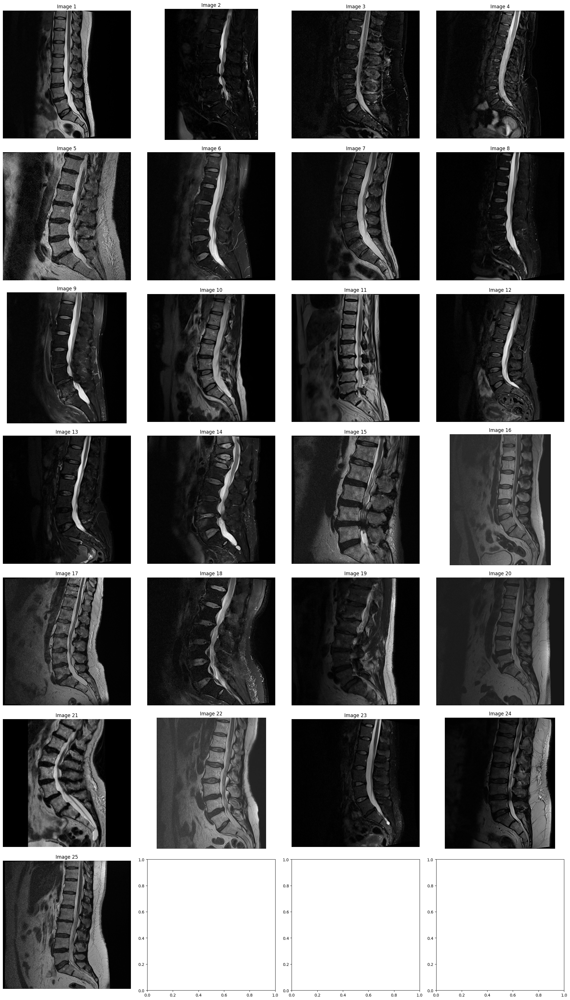

In [34]:
import pydicom
n_images = len(test_diag_list)
n_cols = 4  # Set the number of columns to 4
n_rows = (n_images + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 5 * n_rows))  # Adjust figsize for better spacing
axes = axes.flatten()
for i in range(len(test_diag_list[0][:25])):
  dcm=pydicom.dcmread(test_diag_list[0][i])
  image = dcm.pixel_array
  print('image shape:',image.shape)
  axes[i].imshow(image, cmap='gray')
  axes[i].set_title(f"Image {i+1}")
  axes[i].axis('off')
plt.tight_layout()
plt.show()

In [35]:
import pandas as pd
import re
test_df_ylabel=pd.DataFrame(test_list_labels[0],columns=['case'])
pattern = r'[^\w\s]'
test_df_ylabel = test_df_ylabel.replace(pattern,'', regex=True)
test_df_ylabel.head(2)

,case
0,NormalMild
1,NormalMild


In [36]:
label_encoder = LabelEncoder()
test = pd.DataFrame(test_diag_list[0], columns=['images'])

df_test=pd.concat([test,test_df_ylabel],axis=1)
df_test=df_test.dropna()
df_test['case']=label_encoder.fit_transform(df_train['case'])
df_test.head(2)

,images,case
0,/kaggle/input/rsna-2024-lumbar-spine-degenerat...,1
1,/kaggle/input/rsna-2024-lumbar-spine-degenerat...,1


In [37]:
df_test.shape

(48657, 2)

In [38]:
model.save('my_model.h5')
print("Model saved as my_model.h5")


Model saved as my_model.h5
